In [1]:
# Importing Block
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from scipy.stats import norm
from tqdm.notebook import tqdm
from joblib import delayed, Parallel

In [2]:
global DEBUG
DEBUG = True

## Task 1.3
Price a European call at $t_0 = 0$ with maturity $t_M = 1$, strike $K = 70$, interest rate $r = 0.01$,
upward move $u = 1.05$ and current spot $S_0 = 50$. Derive numerically the convergence rate as $M \rightarrow \infty$.

For first I decide to create function which has in it input next parameters: risk_free, volatility, time_step.

It will return a dict with risk-neutral u,d moves and probability p. This function will be used in Task 1.5 if I
understand all right.

In [3]:
def risk_neutral_probability(risk_free, volatility, time_step):
    _betta = (1/2) * (np.exp(-1 * risk_free * time_step) + np.exp((risk_free + np.square(volatility)) * time_step))
    upperMultiply = _betta + np.sqrt(np.square(_betta) - 1)
    lowerMultiply = 1 / upperMultiply
    probability = (np.exp(risk_free * time_step) - lowerMultiply) / (upperMultiply - lowerMultiply)
    return {'u': upperMultiply, 'd': lowerMultiply, 'p': probability}

Make a control dictionary for storage all initial conditions

For European put we have next schema:

$\Delta t = \frac{T}{M}, \text{where M is number Of Dotes}$

$S_{0,0} = S_0, \text{where $S_0$ is first spot}$

$S_{j,M} = S_{0,0} u^jd^{M-j}, j=0,1,...,M$

$V_{j, M}$ defines by payoff. In case of put - $\max{(S-K, 0)}$

$V_{j, i} = \exp{(-r \Delta t)} * \left(pV_{j+1, i+1} + (1-p)V_{j,i+1}\right)$

Return $V_{0,0}$. There is not any extra check or anything else in European put

In [80]:
def modeling_asset_price(initial_dict):
    timeStep = initial_dict["maturity"] / initial_dict['numberOfDotes']
    initial_dict['downMove'] = 1 / initial_dict["upMove"]
    initial_dict['prob'] = (np.exp(initial_dict["riskFree"] * timeStep) - initial_dict["downMove"]) / (
            initial_dict["upMove"] - initial_dict["downMove"])
    assetPriceArray = np.zeros(shape=(initial_dict["numberOfDotes"], initial_dict["numberOfDotes"]))
    for row in range(0, initial_dict["numberOfDotes"]):
        for line in range(0, row+1):
            assetPriceArray[line, row] = initial_dict["firstSpot"] * \
                                         (initial_dict["upMove"] ** line) * (initial_dict["downMove"] ** (row - line))

    valueOfOption = np.zeros(shape=(initial_dict["numberOfDotes"], initial_dict["numberOfDotes"]))
    PayOff = [max(_assetPrice - initial_conditions["strike"], 0)
              for _assetPrice in assetPriceArray[:, -1]]
    valueOfOption[:, -1] = PayOff

    # print(np.exp(-initial_dict["riskFree"] * timeStep) * (initial_dict["prob"] * 12 + (1 - initial_dict["prob"]) * 20))

    for i in range(2, initial_dict["numberOfDotes"]+1):

        valueOfOption[:, -i] = [np.exp(-initial_dict["riskFree"] * timeStep) * (
            (1 - initial_dict["prob"]) * valueOfOption[j, -i + 1] + (initial_dict["prob"]) * valueOfOption[j+1, -i + 1]
        )
                                for j in range(valueOfOption.shape[0] - i + 1)] + (i - 1) * [0]

    return assetPriceArray, valueOfOption

def bsm_simple_modeling(option_params):
    r = option_params["riskFree"]
    u = option_params["upMove"]
    S0 = option_params["firstSpot"]
    K = option_params["strike"]
    M = option_params["numberOfDotes"]
    dt = 1/M
    p = (u * np.exp(r*dt) - 1) / (np.square(u) - 1)
    sigma = S0 * (u - 1/u) * np.sqrt(p * (1 - p))
    D1 = (np.log(S0/K) + sigma**2 / 2) / sigma
    D2 = (np.log(S0/K) - sigma**2 / 2) / sigma
    V = S0*norm.cdf(D1) - K*norm.cdf(D2)
    return V

initial_conditions = {
    "maturity": 1,
    "strike": 70,
    "upMove": 1.05,
    "firstSpot": 50,
    "riskFree": 0.01,
    "numberOfDotes": 10
}
assetPrice, optionValue = modeling_asset_price(initial_dict=initial_conditions)
V_BSM = bsm_simple_modeling(initial_conditions)
print(f"V_(0,0) = {optionValue[0,0]}")
print(f"BSM solution: V_(0,0) = {V_BSM}")

V_(0,0) = 0.020158670485227792
BSM solution: V_(0,0) = 36.91754121088075


/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_3106/837060570.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_3106/837060570.py:15: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


V_(0,0) = 8.082876396126549
BSM solution: V_(0,0) = 36.91034631119287


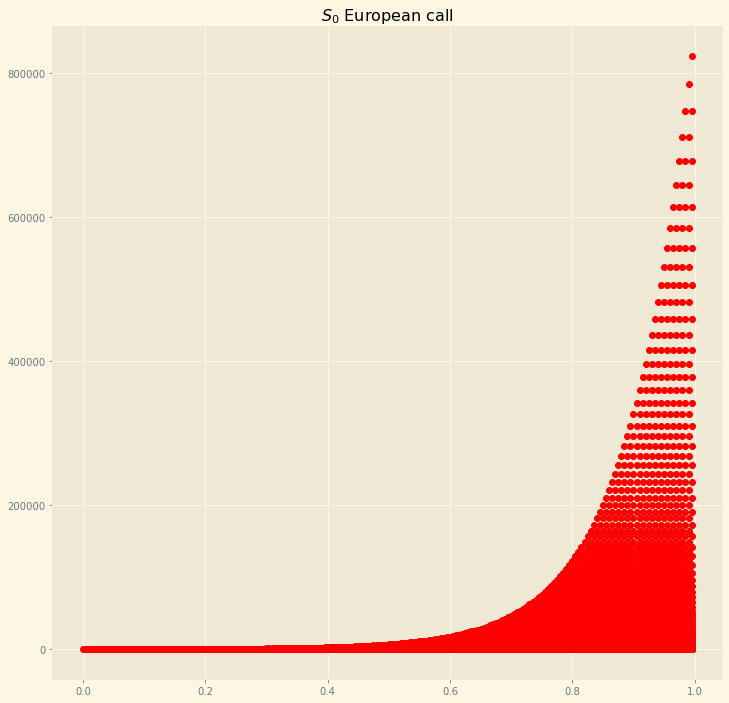

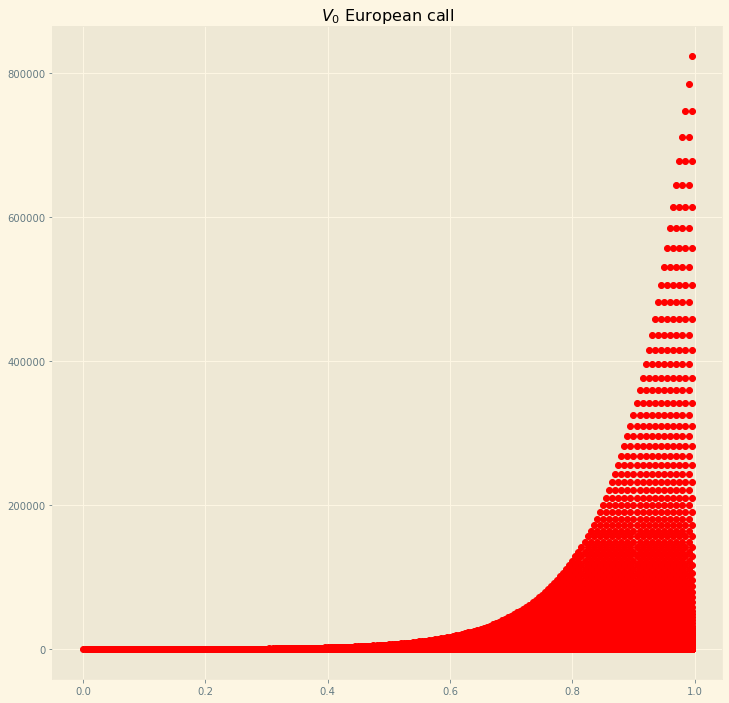

In [5]:
MS = 1 / initial_conditions['numberOfDotes']
plt.style.use('Solarize_Light2')
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
ax.set_title('$S_0$ European call')
for x in range(initial_conditions['numberOfDotes']):
    ax.scatter(x=np.multiply(np.ones(shape=(1,x+1))[0], x*MS), y=assetPrice[:x+1,x], color='red')
fig.show()

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
ax.set_title('$V_0$ European call')
for x in range(initial_conditions['numberOfDotes']):
    ax.scatter(x=np.multiply(np.ones(shape=(1,x+1))[0], x*MS), y=optionValue[:x+1,x], color='red')
fig.show()
print(f"V_(0,0) = {optionValue[0,0]}")
print(f"BSM solution: V_(0,0) = {V_BSM}")

##  Convergence rate

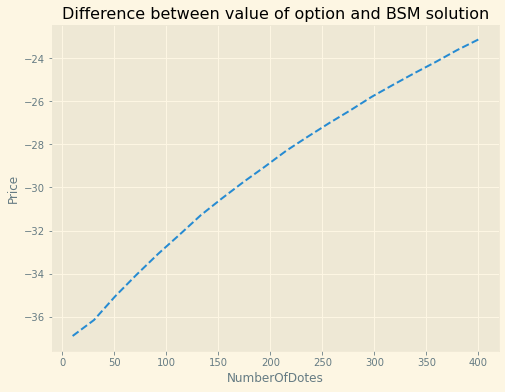

DOTES: 400 -> OPTION VALUE:13.778212503445639
DOTES: 800 -> OPTION VALUE:21.450231344049513
TRUE option value:36.90985146621453
 Convergence Rate = 0.5813730190656454


In [6]:
plt.figure(figsize=(8,6))
plt.title('Difference between value of option and BSM solution')
plt.xlabel('NumberOfDotes')
plt.ylabel('Price')

SAVER = list()
for num, i in enumerate(np.linspace(10, 400, 20)):
    initial_conditions['numberOfDotes'] = int(i)
    assetPrice_1, optionValue_1 = modeling_asset_price(initial_dict=initial_conditions)
    V_BSM_1 = bsm_simple_modeling(initial_conditions)

    initial_conditions['numberOfDotes'] *= 2
    assetPrice_2, optionValue_2 = modeling_asset_price(initial_dict=initial_conditions)
    V_BSM_2 = bsm_simple_modeling(initial_conditions)
    SAVER.append([i, optionValue_1[0,0]])
    convergence = np.log2(abs(optionValue_1[0,0]-V_BSM_1) / abs(optionValue_2[0,0]-V_BSM_2))

V_BSM_2 = bsm_simple_modeling(initial_conditions)
plt.plot([_[0] for _ in SAVER], [_[1] - V_BSM_2 for _ in SAVER], '--')
plt.show()
print(f"DOTES: {initial_conditions['numberOfDotes'] // 2} -> OPTION VALUE:{optionValue_1[0,0]}\nDOTES: {initial_conditions['numberOfDotes']} -> OPTION VALUE:{optionValue_2[0,0]}\nTRUE option value:{V_BSM_2}")
print(f" Convergence Rate = {convergence}")



# Task 1.5

## Firstly create function that solves BSM

In [7]:
def risk_neutral_probability(risk_free, volatility, time_step):
    _betta = (1/2) * (np.exp(-1 * risk_free * time_step) + np.exp((risk_free + np.square(volatility)) * time_step))
    upperMultiply = _betta + np.sqrt(np.square(_betta) - 1)
    lowerMultiply = 1 / upperMultiply
    probability = (np.exp(risk_free * time_step) - lowerMultiply) / (upperMultiply - lowerMultiply)
    return {'upMove': upperMultiply, 'downMove': lowerMultiply, 'prob': probability}

def bsm_true_vol(base_asset, volatility, current_time, option):
    D1 = (np.log(base_asset/option['strike']) + (volatility**2 / 2 + option['riskFree'])*(option['expirationTime'] - current_time)) / (volatility * np.sqrt(option['expirationTime']-current_time))
    D2 = (np.log(base_asset/option['strike']) + (-volatility**2 / 2 + option['riskFree'])*(option['expirationTime'] - current_time)) / (volatility * np.sqrt(option['expirationTime']-current_time))
    V = base_asset*norm.cdf(D1) - option['strike']*np.exp(-1 * option['riskFree']*(option['expirationTime'] - current_time))*norm.cdf(D2)
    return V


def hub_asset(initial_dict):
    """

    :param initial_dict: sample of filling can be seen in variable initial_conditions
    :return:
    """
    timeStep = initial_dict["expirationTime"] / initial_dict['numberOfDotes']
    risk_neutral = risk_neutral_probability(risk_free=initial_dict['riskFree'],
                                            volatility=initial_dict['volatility'],
                                            time_step=timeStep)
    if initial_dict["type"] == "American Call":
        assetPriceArray = np.zeros(shape=(initial_dict["numberOfDotes"], initial_dict["numberOfDotes"]))
        for row in range(0, initial_dict["numberOfDotes"]):
            for line in range(0, row+1):
                assetPriceArray[line, row] = initial_dict["firstSpot"] * \
                                             (risk_neutral["upMove"] ** line) * (risk_neutral["downMove"] ** (row - line))

        valueOfOptionCont = np.zeros(shape=(initial_dict["numberOfDotes"], initial_dict["numberOfDotes"]))
        PayOff = [max(_assetPrice - initial_conditions["strike"], 0)
                  for _assetPrice in assetPriceArray[:, -1]]
        valueOfOptionCont[:, -1] = PayOff

        # print(np.exp(-initial_dict["riskFree"] * timeStep) * (initial_dict["prob"] * 12 + (1 - initial_dict["prob"]) * 20))

        for i in range(2, initial_dict["numberOfDotes"]+1):

            valueOfOptionCont[:, -i] = [np.exp(-initial_dict["riskFree"] * timeStep) * (
                (1 - risk_neutral["prob"]) * valueOfOptionCont[j, -i + 1] + (risk_neutral["prob"]) * valueOfOptionCont[j+1, -i + 1]
            )
                                    for j in range(valueOfOptionCont.shape[0] - i + 1)] + (i - 1) * [0]

        valueOfOption = np.zeros(shape=(initial_dict["numberOfDotes"], initial_dict["numberOfDotes"]))
        for line in range(valueOfOption.shape[0]):
            for row in range(valueOfOption.shape[1]):
                valueOfOption[line,row] = max((assetPriceArray[line,row] - initial_dict["strike"]),
                                              valueOfOptionCont[line, row])
        return assetPriceArray, valueOfOption

    if initial_dict["type"] == "American Put":
        assetPriceArray = np.zeros(shape=(initial_dict["numberOfDotes"], initial_dict["numberOfDotes"]))
        for row in range(0, initial_dict["numberOfDotes"]):
            for line in range(0, row+1):
                assetPriceArray[line, row] = initial_dict["firstSpot"] * \
                                             (risk_neutral["upMove"] ** line) * (risk_neutral["downMove"] ** (row - line))

        valueOfOptionCont = np.zeros(shape=(initial_dict["numberOfDotes"], initial_dict["numberOfDotes"]))
        PayOff = [max(initial_conditions["strike"] - _assetPrice, 0)
                  for _assetPrice in assetPriceArray[:, -1]]
        valueOfOptionCont[:, -1] = PayOff

        # print(np.exp(-initial_dict["riskFree"] * timeStep) * (initial_dict["prob"] * 12 + (1 - initial_dict["prob"]) * 20))

        for i in range(2, initial_dict["numberOfDotes"]+1):

            valueOfOptionCont[:, -i] = [np.exp(-initial_dict["riskFree"] * timeStep) * (
                (1 - risk_neutral["prob"]) * valueOfOptionCont[j, -i + 1] + (risk_neutral["prob"]) * valueOfOptionCont[j+1, -i + 1]
            )
                                    for j in range(valueOfOptionCont.shape[0] - i + 1)] + (i - 1) * [0]

        valueOfOption = np.zeros(shape=(initial_dict["numberOfDotes"], initial_dict["numberOfDotes"]))
        for line in range(valueOfOption.shape[0]):
            for row in range(valueOfOption.shape[1]):
                valueOfOption[line,row] = max((initial_dict["strike"] - assetPriceArray[line,row]),
                                              valueOfOptionCont[line, row])
        return assetPriceArray, valueOfOption


    if initial_dict["type"] == 'Europenian Call':
        assetPriceArray = np.zeros(shape=(initial_dict["numberOfDotes"], initial_dict["numberOfDotes"]))
        for row in range(0, initial_dict["numberOfDotes"]):
            for line in range(0, row+1):
                assetPriceArray[line, row] = initial_dict["firstSpot"] * \
                                             (risk_neutral["upMove"] ** line) * (risk_neutral["downMove"] ** (row - line))

        valueOfOption = np.zeros(shape=(initial_dict["numberOfDotes"], initial_dict["numberOfDotes"]))
        PayOff = [max(_assetPrice - initial_conditions["strike"], 0)
                  for _assetPrice in assetPriceArray[:, -1]]
        valueOfOption[:, -1] = PayOff

        # print(np.exp(-initial_dict["riskFree"] * timeStep) * (initial_dict["prob"] * 12 + (1 - initial_dict["prob"]) * 20))

        for i in range(2, initial_dict["numberOfDotes"]+1):

            valueOfOption[:, -i] = [np.exp(-initial_dict["riskFree"] * timeStep) * (
                (1 - risk_neutral["prob"]) * valueOfOption[j, -i + 1] + (risk_neutral["prob"]) * valueOfOption[j+1, -i + 1]
            )
                                    for j in range(valueOfOption.shape[0] - i + 1)] + (i - 1) * [0]
        if DEBUG:
            MS = initial_dict['expirationTime'] / initial_dict['numberOfDotes']
            plt.style.use('Solarize_Light2')
            fig = plt.figure(figsize=(12,12))
            ax = fig.add_subplot(111)
            ax.set_title('$S_0$')
            for x in range(initial_dict['numberOfDotes']):
                ax.scatter(x=np.multiply(np.ones(shape=(1,x+1))[0], x*MS), y=assetPriceArray[:x+1,x], color='red')
            fig.show()

        return assetPriceArray, valueOfOption


initial_conditions['expirationTime'] = 1
print(initial_conditions)
bsm_true_vol(base_asset=initial_conditions['firstSpot'], volatility=2.43, current_time=0, option=initial_conditions)

{'maturity': 1, 'strike': 70, 'upMove': 1.05, 'firstSpot': 50, 'riskFree': 0.01, 'numberOfDotes': 800, 'downMove': 0.9523809523809523, 'prob': 0.48793292762957585, 'expirationTime': 1}


36.86253863892622

# Convergence of European Call with Seydel parameters

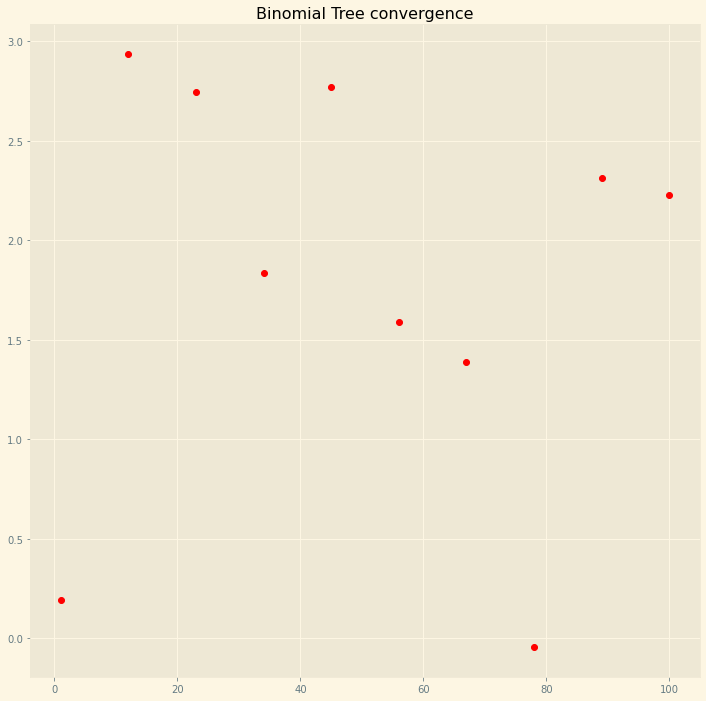

DOTES: 100 -> OPTION VALUE:16.91778123136331
DOTES: 200 -> OPTION VALUE:16.93897586444899
 TRUE:16.95001694780005
 Convergence Rate = 2.23008670410512


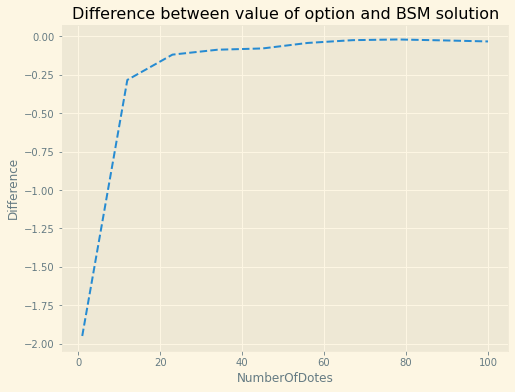

In [8]:
DEBUG = False
initial_conditions = {
    "riskFree": 0.01,
    "volatility": 0.4,
    "firstSpot": 50,
    "expirationTime": 1,
    "strike": 35,
    "type": "Europenian Call",
    "numberOfDotes": 21,
    }
plt.figure(figsize=(12,12))
plt.title('Binomial Tree convergence')

SAVER = list()
for num, i in enumerate(np.linspace(1, 100, 10)):
    initial_conditions['numberOfDotes'] = int(i)


    assetPrice_1, optionValue_1 = hub_asset(initial_dict=initial_conditions)
    V_BSM_1 = bsm_true_vol(base_asset=initial_conditions['firstSpot'],
                           volatility=initial_conditions['volatility'],
                           current_time=0,
                           option=initial_conditions)

    initial_conditions['numberOfDotes'] *= 2

    assetPrice_2, optionValue_2 = hub_asset(initial_dict=initial_conditions)
    V_BSM_2 = bsm_true_vol(base_asset=initial_conditions['firstSpot'],
                           volatility=initial_conditions['volatility'],
                           current_time=0,
                           option=initial_conditions)
    convergence = np.log2(abs(optionValue_1[0,0]-V_BSM_1) / abs(optionValue_2[0,0]-V_BSM_2)) / np.log(2)
    plt.plot(i, convergence, 'o', color='red')
    SAVER.append([i, optionValue_1[0,0]])
plt.show()
print(f"DOTES: {initial_conditions['numberOfDotes'] // 2} -> OPTION VALUE:{optionValue_1[0,0]}\nDOTES: {initial_conditions['numberOfDotes']} -> OPTION VALUE:{optionValue_2[0,0]}\n TRUE:{V_BSM_2}")
print(f" Convergence Rate = {convergence}")
plt.figure(figsize=(8,6))
plt.title('Difference between value of option and BSM solution')
plt.xlabel('NumberOfDotes')
plt.ylabel('Difference')
plt.plot([_[0] for _ in SAVER], [_[1] - V_BSM_2 for _ in SAVER], '--')
plt.show()

# Task 1.5
#### Use the dynamic programming principle to price an American put with strike $K = 35$, using the same set-up and performing the same analysis as in previous questions.

I suggest that i should use risk-neutral probability module, like it is said in SeydelBook about dynamic programming.
So module risk_neutral_probability takes as parameters: risk-free-rate, historical volatility and time_step

It returns upper and down step multiplier and probability measure (im not really sure that this can be called like a measure)

/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_3106/1175379063.py:25: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_3106/1175379063.py:32: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


V_(0,0) = 1.4588368341723248


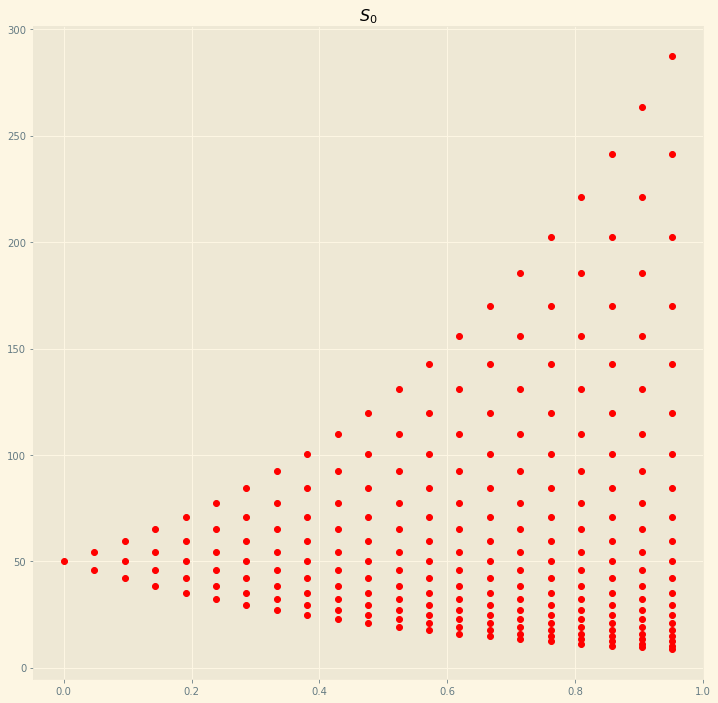

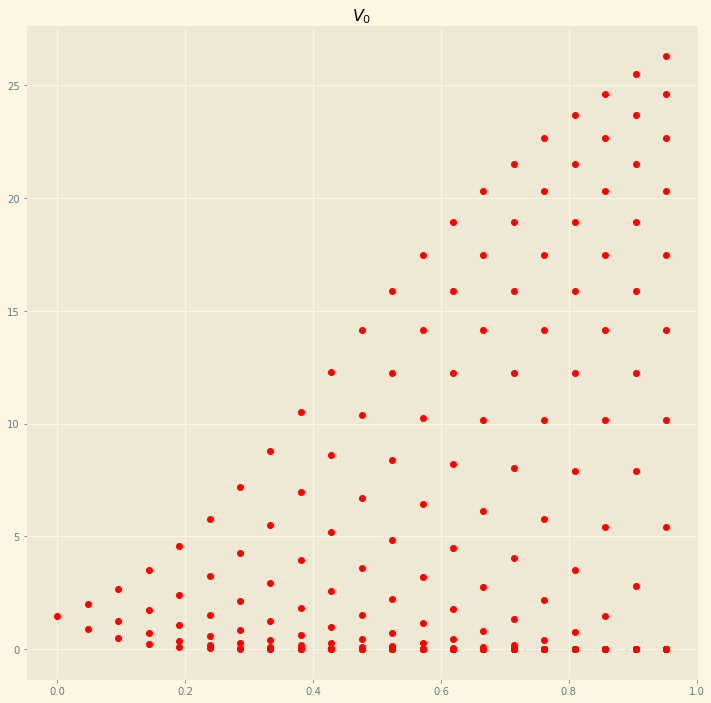

In [9]:
def bsm_true_vol_put(base_asset, volatility, current_time, option):
    D1 = (np.log(base_asset/option['strike']) + (volatility**2 / 2 + option['riskFree'])*(option['expirationTime'] - current_time)) / (volatility * np.sqrt(option['expirationTime']-current_time))
    D2 = (np.log(base_asset/option['strike']) + (-volatility**2 / 2 + option['riskFree'])*(option['expirationTime'] - current_time)) / (volatility * np.sqrt(option['expirationTime']-current_time))
    V = -1 * base_asset*norm.cdf(-1 * D1) + option['strike']*np.exp(-1 * option['riskFree']*(option['expirationTime'] - current_time))*norm.cdf(-1 * D2)
    return V
initial_conditions = {
        "riskFree": 0.01,
        "volatility": 0.4,
        "firstSpot": 50,
        "expirationTime": 1,
        "strike": 35,
        "type": "American Put",
        "numberOfDotes": 21,
    }

assetPrice, optionValue = hub_asset(initial_conditions)

MS = 1 / initial_conditions['numberOfDotes']
plt.style.use('Solarize_Light2')
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
ax.set_title('$S_0$')
for x in range(initial_conditions['numberOfDotes']):
    ax.scatter(x=np.multiply(np.ones(shape=(1,x+1))[0], x*MS), y=assetPrice[:x+1,x], color='red')
fig.show()

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
ax.set_title('$V_0$')
for x in range(initial_conditions['numberOfDotes']):
    ax.scatter(x=np.multiply(np.ones(shape=(1,x+1))[0], x*MS), y=optionValue[:x+1,x], color='red')
fig.show()
print(f"V_(0,0) = {optionValue[0,0]}")

## Convergence for American PUT

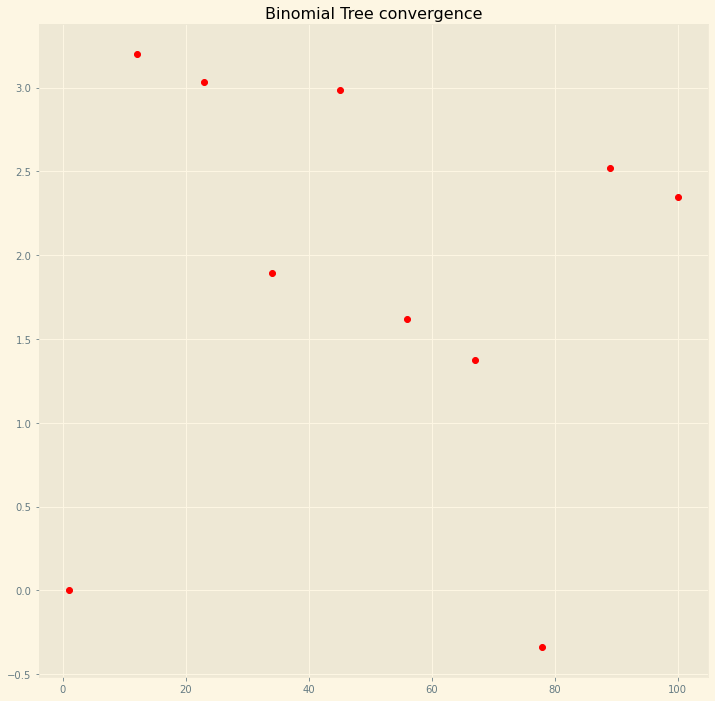

DOTES: 100 -> OPTION VALUE:1.5729907602665252
DOTES: 200 -> OPTION VALUE:1.5924526761940503
 TRUE:1.6017611290209368
 Convergence Rate = 2.348664840567421


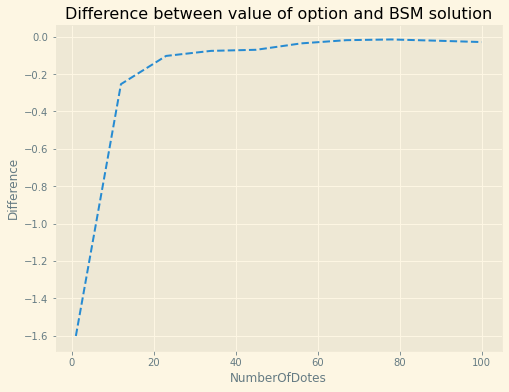

In [10]:
DEBUG = False
initial_conditions = {
    "riskFree": 0.01,
    "volatility": 0.4,
    "firstSpot": 50,
    "expirationTime": 1,
    "strike": 35,
    "type": "American Put",
    "numberOfDotes": 21,
    }
plt.figure(figsize=(12,12))
plt.title('Binomial Tree convergence')

SAVER = list()
for num, i in enumerate(np.linspace(1, 100, 10)):
    initial_conditions['numberOfDotes'] = int(i)


    assetPrice_1, optionValue_1 = hub_asset(initial_dict=initial_conditions)
    V_BSM_1 = bsm_true_vol_put(base_asset=initial_conditions['firstSpot'],
                           volatility=initial_conditions['volatility'],
                           current_time=0,
                           option=initial_conditions)

    initial_conditions['numberOfDotes'] *= 2

    assetPrice_2, optionValue_2 = hub_asset(initial_dict=initial_conditions)
    V_BSM_2 = bsm_true_vol_put(base_asset=initial_conditions['firstSpot'],
                           volatility=initial_conditions['volatility'],
                           current_time=0,
                           option=initial_conditions)
    convergence = np.log2(abs(optionValue_1[0,0]-V_BSM_1) / abs(optionValue_2[0,0]-V_BSM_2)) / np.log(2)
    plt.plot(i, convergence, 'o', color='red')
    SAVER.append([i, optionValue_1[0,0]])
plt.show()
print(f"DOTES: {initial_conditions['numberOfDotes'] // 2} -> OPTION VALUE:{optionValue_1[0,0]}\nDOTES: {initial_conditions['numberOfDotes']} -> OPTION VALUE:{optionValue_2[0,0]}\n TRUE:{V_BSM_2}")
print(f" Convergence Rate = {convergence}")
plt.figure(figsize=(8,6))
plt.title('Difference between value of option and BSM solution')
plt.xlabel('NumberOfDotes')
plt.ylabel('Difference')
plt.plot([_[0] for _ in SAVER], [_[1] - V_BSM_2 for _ in SAVER], '--')
plt.show()

# Task 1.4
## Delta Hedging
### Firstly define function to create price ways

In [11]:
def gbm_Simulation(params, M):
    n = params['numberOfDotes']
    sigma = params['volatility']
    mu = params["riskFree"]
    S0 = params["firstSpot"]
    K = params["strike"]
    T = 1
    dt = T/n

    # simulation using numpy arrays
    St = np.exp((mu - sigma ** 2 / 2) * dt + sigma * np.random.normal(0, np.sqrt(dt), size=(M,n)).T)
    # include array of 1's
    St = np.vstack([np.ones(M), St])

    # multiply through by S0 and return the cumulative product of elements along a given simulation path (axis=0).
    St = S0 * St.cumprod(axis=0)
    # Define time interval correctly
    time = np.linspace(0,T,n+1)
    # Require numpy array that is the same shape as St
    tt = np.full(shape=(M,n+1), fill_value=time).T
    return tt, St

## Sample of creation

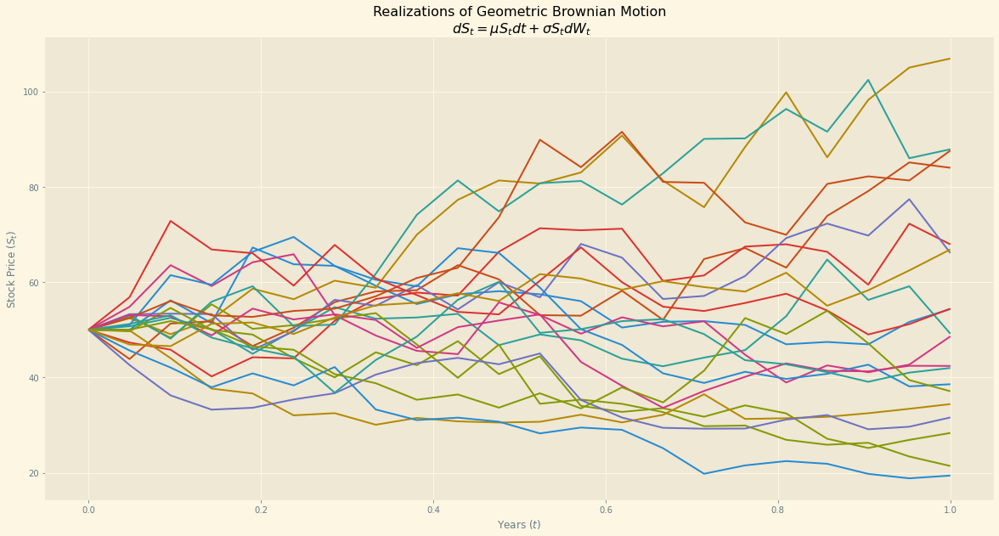

In [12]:
initial_conditions = {
        "riskFree": 0.01,
        "volatility": 0.4,
        "firstSpot": 50,
        "expirationTime": 1,
        "strike": 70,
        "type": "Europenian Call",
        "numberOfDotes": 21,
    }

tt, St = gbm_Simulation(initial_conditions, M = 20)
plt.figure(figsize=(20,10))
plt.plot(tt, St)
plt.xlabel("Years $(t)$")
plt.ylabel("Stock Price $(S_t)$")
plt.title(
    "Realizations of Geometric Brownian Motion\n $dS_t = \mu S_t dt + \sigma S_t dW_t$")
plt.show()

Calculate $\Delta$ like $\frac{V_{zero}(S_t + \delta S) - V_{zero}(S_t)}{\delta S}$

Calculate $\Delta$ $n$ times, where $n$ - is number of reconstructions. We are interested about making
dependency between volatility of hedged portfolio and number of reconstructions
### Firstly create fuction to make delta-hedged portfolio

/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_3106/1280660198.py:98: DeprecationWarning: setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.
  valueOfOption[:, -i] = [np.exp(-initial_dict["riskFree"] * timeStep) * (


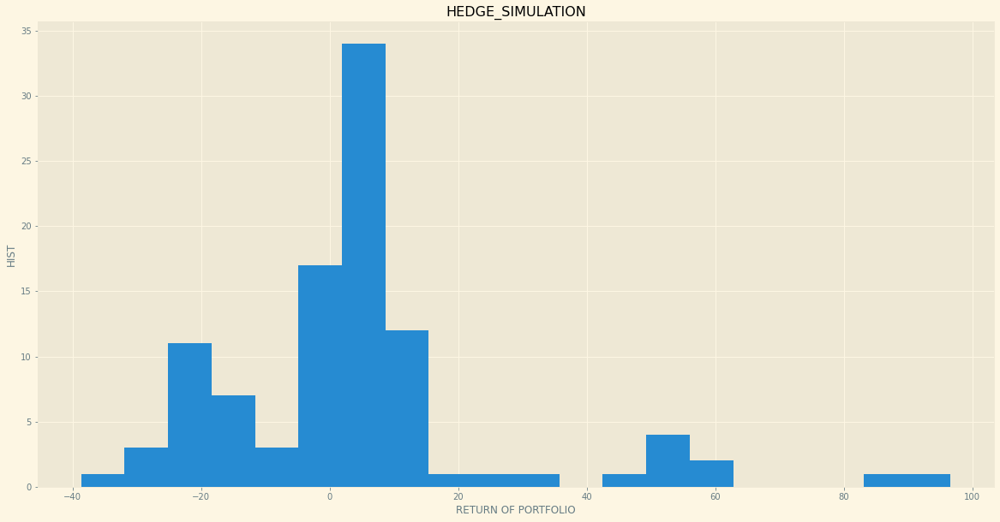

In [13]:
DELTA = .3
DEBUG = False

def unique_path(params, reconstructNumber):
    n = params['numberOfDotes']
    sigma = params['volatility']
    mu = params["riskFree"]
    S0 = params["firstSpot"]
    K = params["strike"]
    M = 1
    T = 1
    dt = T/n

    # simulation using numpy arrays
    St = np.exp((mu - sigma ** 2 / 2) * dt + sigma * np.random.normal(0, np.sqrt(dt), size=(M,n)).T)
    # include array of 1's
    St = np.vstack([np.ones(M), St])

    # multiply through by S0 and return the cumulative product of elements along a given simulation path (axis=0).
    St = S0 * St.cumprod(axis=0)
    # Define time interval correctly
    time = np.linspace(0,T,n+1)
    # Require numpy array that is the same shape as St
    tt = np.full(shape=(M,n+1), fill_value=time).T

    DeltaHArray = list()
    OptionPriceStep = list()
    AssetArray = list()
    TimeRecombine = list()

    for _reconstructNumber in range(reconstructNumber):
        condition = {
            "riskFree": params['riskFree'],
            "volatility": params['volatility'],
            "firstSpot": St[_reconstructNumber],
            # "expirationTime": 1 - dt * _reconstructNumber * (params['numberOfDotes'] // reconstructNumber),
            "expirationTime": 1 - tt[_reconstructNumber * (params['numberOfDotes'] // reconstructNumber)],
            "strike": params['strike'],
            "type": params['type'],
            "numberOfDotes": params['numberOfDotes'] -
                             (_reconstructNumber * (params['numberOfDotes'] // reconstructNumber)),
        }
        asset, option = hub_asset(condition)
        V0 = option[0,0]
        OptionPriceStep.append(V0)
        condition['firstSpot'] += DELTA
        asset, option = hub_asset(condition)
        V1 = option[0,0]
        deltaH = (V1 - V0) / DELTA
        DeltaHArray.append(deltaH)
        AssetArray.append(St[_reconstructNumber])
        TimeRecombine.append(tt[_reconstructNumber * (params['numberOfDotes'] // reconstructNumber)])

    # print(f"Portfolio i = V_i - Delta_i S_i")
    # for i in range(len(OptionPriceStep)):
    #     print(f"Portfolio {i} = {OptionPriceStep[i] - DeltaHArray[i] * AssetArray[i]}; At time {TimeRecombine[i]}")
    #
    # print(f'Realized Portfolio: {max(St[-1]-params["strike"], 0) - DeltaHArray[-1] * St[-1]}')
    # print('; delta='.join([str(x) for x in DeltaHArray]))
    HEDGE_PAY = sum([DeltaHArray[i] * (AssetArray[i] - AssetArray[i - 1] ) for i in range(1, len(DeltaHArray) -1)])
    TOTAL = max(St[-1]-K, 0) + OptionPriceStep[0] + HEDGE_PAY - DeltaHArray[-1] * AssetArray[-1]

    return tt, St, TOTAL

initial_conditions = {
        "riskFree": 0.01,
        "volatility": 0.8,
        "firstSpot": 50,
        "expirationTime": 1,
        "strike": 70,
        # "type": "Europenian Call",
        "type": "Europenian Call",
        "numberOfDotes": 20,
    }
HIST_ARRAY = []
for num in range(100):
    tBack, SBack, TOTAL = unique_path(initial_conditions, reconstructNumber=5)
    HIST_ARRAY.append(TOTAL)
plt.figure(figsize=(20,10))
plt.hist([x[0] for x in HIST_ARRAY], bins=20)
plt.xlabel("RETURN OF PORTFOLIO")
plt.ylabel("HIST")
plt.title("HEDGE_SIMULATION")
plt.show()

Now by changing number of reconstructions we look at volatility of hedged portfolio

  0%|          | 0/10 [00:00<?, ?it/s]

/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_3106/1280660198.py:98: DeprecationWarning: setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.
/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_3106/1280660198.py:98: DeprecationWarning: setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.
/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_3106/1280660198.py:98: DeprecationWarning: setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np

[(1, 26.98055155771281), (3, 51.61917351307603), (5, 30.07149220320539), (7, 35.92528220166158), (9, 35.53892677507981), (11, 30.977739652157478), (13, 34.3354749072464), (15, 30.623076005865904), (17, 41.44714660397703), (19, 32.067591966988324)]


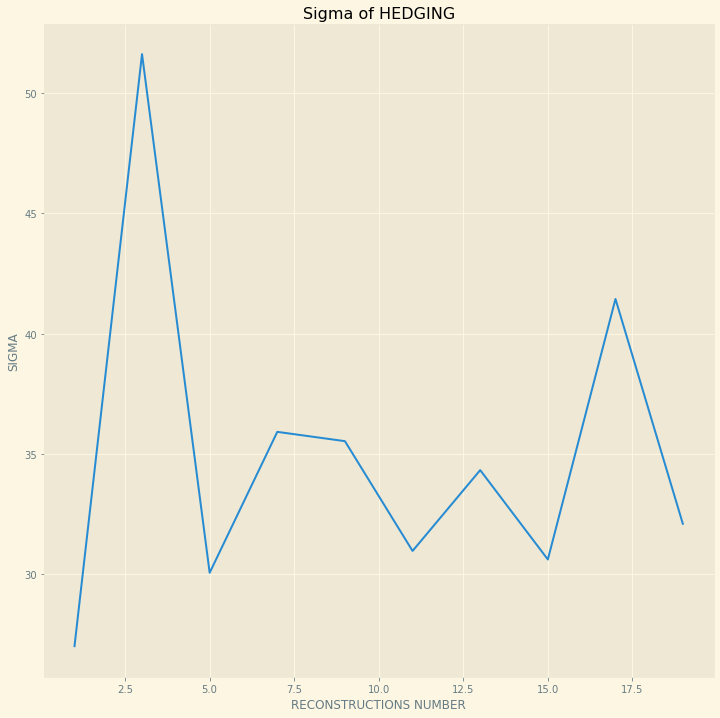

In [16]:
def sigmaHEDGE():
    def one_rec(number_of_rec):
        rec = number_of_rec
        initial_conditions = {
                "riskFree": 0.01,
                "volatility": 0.8,
                "firstSpot": 50,
                "expirationTime": 1,
                "strike": 70,
                # "type": "Europenian Call",
                "type": "Europenian Call",
                "numberOfDotes": 100,
                "simulationNumber": 200
            }
        HIST_ARRAY = []
        for num in tqdm(range(initial_conditions['simulationNumber']), leave=False):
            tBack, SBack, TOTAL = unique_path(initial_conditions, reconstructNumber=rec)
            HIST_ARRAY.append(TOTAL)

        return rec, np.std(HIST_ARRAY), np.mean(HIST_ARRAY)

    RESULTS = Parallel(n_jobs=-1)(delayed(one_rec)(rec) for rec in tqdm(np.arange(1, 20, 2)))
    return [reconstruct[0] for reconstruct in RESULTS], [sigma[1] for sigma in RESULTS],[meanV[2] for meanV in RESULTS],

RECONSTRUCT, SIGMA, meanV = sigmaHEDGE()
plt.figure(figsize=(12,12))
plt.title('Sigma/Mean of HEDGING')
plt.ylabel('SIGMA')
plt.xlabel('RECONSTRUCTIONS NUMBER')
plt.plot(RECONSTRUCT, np.divide(SIGMA, meanV))

# Block 2
## Equations for Task 1 and Task 2 are at notes pdf.
### First lets solve BSM in heat equation form.

$V(S,\tau) = S_0 F\left[\frac{\ln{(Se^{r\tau}} / K)}{\sigma \sqrt{\tau}} + \frac{\sigma \sqrt{\tau}}{2}\right]-
Ke^{-r \tau} F\left[\frac{\ln{(Se^{r\tau}} / K)}{\sigma \sqrt{\tau}} - \frac{\sigma \sqrt{\tau}}{2}\right]$
Where $F$ - is cdf of scaled normal distribution.

In [6]:
def plotly_visualize(V, t, S):
    fig = go.Figure(data=[go.Surface(z=V, x = S, y = t)])
    fig.update_layout(title='V(S,t)', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))
    fig.update_layout(xaxis_title='Asset Price', yaxis_title='Time')
    fig.show()

def heat_value_of_option(S, t, option, mode='1'):
    if mode == '1':
        firstFrac = np.log(S * np.exp(option['riskFree'] * t)
                           / option['strike']) / (option['volatility'] * np.sqrt(t))
        secondFrac = option['volatility'] * np.sqrt(t) / 2

        firstCDF = norm.cdf(firstFrac + secondFrac)
        secondCDF = norm.cdf(firstFrac - secondFrac)

        return (S * firstCDF) - (option['strike'] * np.exp(option['riskFree'] * t) * secondCDF)
    if mode == '2':
        D1 = (np.log(S/option['strike']) + (option['volatility']**2 / 2 + option['riskFree'])*(option['expirationTime'] - t)) / (option['volatility'] * np.sqrt(option['expirationTime']-t))
        D2 = (np.log(S/option['strike']) + (-option['volatility']**2 / 2 + option['riskFree'])*(option['expirationTime'] - t)) / (option['volatility'] * np.sqrt(option['expirationTime']-t))
        V = S*norm.cdf(D1) - option['strike']*np.exp(option['riskFree']*(option['expirationTime'] - t))*norm.cdf(D2)
        return V

def bsm_true(optionParams):
    timeStepGrid = np.linspace(0, 1, optionParams['numberOfDotes'])
    timeStepGrid = np.subtract(optionParams['expirationTime'], timeStepGrid)
    assetPriceGrid = np.linspace(.01, 200, optionParams['numberOfDotes'])

    optionPrice = np.zeros(shape=(len(timeStepGrid), len(assetPriceGrid)))
    for lineNumber, time in enumerate(timeStepGrid):
        for rowNumber, asset in enumerate(assetPriceGrid):
            optionPrice[lineNumber, rowNumber] = heat_value_of_option(S=asset,
                                                                      t=time,
                                                                      option=optionParams,
                                                                      mode='1')
    plotly_visualize(optionPrice, timeStepGrid, assetPriceGrid)


initial_conditions = {
        "riskFree": 0,
        "volatility": 0.8,
        "firstSpot": 50,
        "expirationTime": 1,
        "strike": 70,
        # "type": "Europenian Call",
        "type": "Europenian Call",
        "numberOfDotes": 15,
    }
bsm_true(initial_conditions)

/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_576/1928859247.py:11: RuntimeWarning:

divide by zero encountered in double_scalars



## Task 2.2

Asymptotic on $\pm \infty$

$u \rightarrow Ke^x = S-K$, when $x \rightarrow + \infty$
$u \rightarrow 0$, when $x \rightarrow - \infty$

## Task 2.3 (SeydelBook)


Explicit model convergence: $O(\Delta x^2, \Delta \tau)$

Implicit model convergence: $O(\Delta x^2, \Delta \tau)$

$x_{min} < min(0, \ln{\frac{S_0}{K}})$. Seydel takes $x_{min} = -3$

$x_{max} > max(0, \ln{\frac{S_0}{K}})$. Seydel takes $x_{min} = 3$

In [69]:
class ManagerClass:
    def __init__(self, SHOW=True):
        self.volatility = .8
        self.riskFree = 0.
        self.expirationTime = 1
        self.strike = 70
        self.numberOfDotes = 70
        self.initialAssetPrice = 50
        self.q = 2 * self.riskFree / np.square(self.volatility)

        self.currentNumber = .3

        self.SHOW= SHOW
    def call_zero_t(self, x):
        return max(np.exp((x/2) * (self.q + 1)) - np.exp((x/2) * (self.q - 1)), 0)

    def create_borders(self):
        x_min = min(-3, min(0, np.log(self.initialAssetPrice / self.strike)))
        # x_max = max(3, max(0, np.log(self.initialAssetPrice / self.strike)))
        x_max = 1.2
        tau_min = 0
        tau_max = self.expirationTime * np.square(self.volatility) / 2
        x_grid = np.linspace(x_min, x_max, self.numberOfDotes)
        delta_tau = ((x_max - x_min) / self.numberOfDotes) ** 2 * self.currentNumber
        numberOfTau = int(tau_max // delta_tau)
        tau_grid = np.linspace(tau_min, tau_max, numberOfTau)
        return x_grid, tau_grid


    def explicit_method_matrix(self):
        x_grid, tau_grid = self.create_borders()

        W = np.zeros(shape=(x_grid.shape[0], tau_grid.shape[0]))
        W.fill(np.nan)
        # Infinity boundary
        _inEXP1 = -(self.q - 1) * x_grid[-1] / 2
        _sTransformedByX = self.strike * np.exp(x_grid[-1])
        for row in range(tau_grid.shape[0]):
            _inEXP2 = - (np.square(self.q - 1) / 4 + self.q) * tau_grid[row]
            transformationToYUpperBorder = self.strike * np.exp(_inEXP1 + _inEXP2)
            W[-1, row] = (_sTransformedByX - self.strike) / transformationToYUpperBorder
        # Expiration boundary
        for line in range(x_grid.shape[0]):
            W[line,0] = self.call_zero_t(x_grid[line])

        # Zero boundary
        W[0, :] = 0 # When Price of Asset = 0


        matrix_A = np.zeros(shape=(self.numberOfDotes, self.numberOfDotes))
        matrix_A[0,0] = 1
        # matrix_A[0, 1] = 0
        matrix_A[1, 0] = 0
        for i in range(1, matrix_A.shape[0]-1):
            matrix_A[i,i] = 1 - 2 * self.currentNumber
            matrix_A[i, i+1] = self.currentNumber
            matrix_A[i+1, i] = self.currentNumber
        matrix_A[-1,-1] = 1
        # matrix_A[-2, -1] = 0
        matrix_A[-1, -2] = 0

        for row in range(1, tau_grid.shape[0]):
            vectorW = W[:, row-1]
            vectorWadd1 = np.dot(matrix_A, vectorW)
            W[:, row] = vectorWadd1

            _inEXP2 = - (np.square(self.q - 1) / 4 + self.q) * tau_grid[row]
            transformationToYUpperBorder = self.strike * np.exp(_inEXP1 + _inEXP2)
            W[-1, row] = (_sTransformedByX - self.strike) / transformationToYUpperBorder
            # W[0, row] = 0

        # plotly_visualize(W, x_grid, tau_grid)

        for line in range(x_grid.shape[0]):
            for row in range(tau_grid.shape[0]):
                _inEXP1 = -(self.q - 1) * x_grid[line] / 2
                _inEXP2 = - (np.square(self.q - 1) / 4 + self.q) * tau_grid[row]
                transformationToYUpperBorder = self.strike * np.exp(_inEXP1 + _inEXP2)
                W[line, row] = W[line, row] * transformationToYUpperBorder

        for line in range(x_grid.shape[0]):
            x_grid[line] = self.strike * np.exp(x_grid[line])

        for row in range(tau_grid.shape[0]):
            tau_grid[row] = self.expirationTime - (2* tau_grid[row] / np.square(self.volatility))

        if self.SHOW:
            plotly_visualize(W, x_grid, tau_grid)
        return W, x_grid, tau_grid


    def implicit_method_matrix(self):
        x_grid, tau_grid = self.create_borders()

        W = np.zeros(shape=(x_grid.shape[0], tau_grid.shape[0]))
        W.fill(np.nan)
        # Infinity boundary
        _inEXP1 = -(self.q - 1) * x_grid[-1] / 2
        _sTransformedByX = self.strike * np.exp(x_grid[-1])
        for row in range(tau_grid.shape[0]):
            _inEXP2 = - (np.square(self.q - 1) / 4 + self.q) * tau_grid[row]
            transformationToYUpperBorder = self.strike * np.exp(_inEXP1 + _inEXP2)
            W[-1, row] = (_sTransformedByX - self.strike) / transformationToYUpperBorder
        # Expiration boundary
        for line in range(x_grid.shape[0]):
            W[line,0] = self.call_zero_t(x_grid[line])

        # Zero boundary
        W[0, :] = 0 # When Price of Asset = 0


        matrix_A = np.zeros(shape=(self.numberOfDotes, self.numberOfDotes))
        matrix_A[0,0] = 1
        # matrix_A[0, 1] = 0
        matrix_A[1, 0] = 0
        for i in range(1, matrix_A.shape[0]-1):
            matrix_A[i,i] = 1 + 2 * self.currentNumber
            matrix_A[i, i+1] = -1 * self.currentNumber
            matrix_A[i+1, i] = -1 * self.currentNumber
        matrix_A[-1,-1] = 1
        # matrix_A[-2, -1] = 0
        matrix_A[-1, -2] = 0
        for row in range(1, tau_grid.shape[0]):
            vectorW = W[:, row-1]
            vectorWadd1 = np.linalg.solve(a=matrix_A, b=vectorW)
            W[:, row] = vectorWadd1

            _inEXP2 = - (np.square(self.q - 1) / 4 + self.q) * tau_grid[row]
            transformationToYUpperBorder = self.strike * np.exp(_inEXP1 + _inEXP2)
            W[-1, row] = (_sTransformedByX - self.strike) / transformationToYUpperBorder
            W[0, row] = 0

        # plotly_visualize(W, x_grid, tau_grid)

        for line in range(x_grid.shape[0]):
            for row in range(tau_grid.shape[0]):
                _inEXP1 = -(self.q - 1) * x_grid[line] / 2
                _inEXP2 = - (np.square(self.q - 1) / 4 + self.q) * tau_grid[row]
                transformationToYUpperBorder = self.strike * np.exp(_inEXP1 + _inEXP2)
                W[line, row] = W[line, row] * transformationToYUpperBorder

        for line in range(x_grid.shape[0]):
            x_grid[line] = self.strike * np.exp(x_grid[line])

        for row in range(tau_grid.shape[0]):
            tau_grid[row] = self.expirationTime - (2* tau_grid[row] / np.square(self.volatility))

        if self.SHOW:
            plotly_visualize(W, x_grid, tau_grid)
        return W, x_grid, tau_grid

    def explicit_method(self):
        x_grid, tau_grid = self.create_borders()


        W = np.zeros(shape=(x_grid.shape[0], tau_grid.shape[0]))
        W.fill(np.nan)
        # Infinity boundary
        _inEXP1 = -(self.q - 1) * x_grid[-1] / 2
        _sTransformedByX = self.strike * np.exp(x_grid[-1])
        for row in range(tau_grid.shape[0]):
            _inEXP2 = - (np.square(self.q - 1) / 4 + self.q) * tau_grid[row]
            transformationToYUpperBorder = self.strike * np.exp(_inEXP1 + _inEXP2)
            W[-1, row] = (_sTransformedByX - self.strike) / transformationToYUpperBorder
        # Expiration boundary
        for line in range(x_grid.shape[0]):
            W[line,0] = self.call_zero_t(x_grid[line])

        # Zero boundary
        W[0, :] = 0 # When Price of Asset = 0
        # line == ln S
        # row == T - tau
        # for row in range(tau_grid.shape[0] - 1):
        #     matrixA =
        #     # W[:, row+1] = np.dot(,W[:, row])
        for row in range(1, tau_grid.shape[0]):
            for line in range(1, x_grid.shape[0] - 1):
                W[line, row] = W[line, row-1] + self.currentNumber * \
                                 (W[line+1, row-1] - 2*W[line, row-1] + W[line-1, row-1])
        for line in range(x_grid.shape[0]):
            _inEXP1 = -(self.q - 1) * x_grid[line] / 2
            for row in range(tau_grid.shape[0]):
                _inEXP2 = -1 * ((np.square(self.q - 1) / 4) + self.q) * tau_grid[row]
                transformationToYUpperBorder = self.strike * np.exp(_inEXP1 + _inEXP2)
                W[line, row] = W[line, row] * transformationToYUpperBorder

        for line in range(x_grid.shape[0]):
            x_grid[line] = self.strike * np.exp(x_grid[line])

        for row in range(tau_grid.shape[0]):
            tau_grid[row] = self.expirationTime - (2* tau_grid[row] / np.square(self.volatility))

        if self.SHOW:
            plotly_visualize(W, x_grid, tau_grid)
        return W, x_grid, tau_grid

    def crank_nicolson_method(self):
        x_grid, tau_grid = self.create_borders()

        W = np.zeros(shape=(x_grid.shape[0], tau_grid.shape[0]))
        W.fill(np.nan)
        # Infinity boundary
        _inEXP1 = -(self.q - 1) * x_grid[-1] / 2
        _sTransformedByX = self.strike * np.exp(x_grid[-1])
        for row in range(tau_grid.shape[0]):
            _inEXP2 = - (np.square(self.q - 1) / 4 + self.q) * tau_grid[row]
            transformationToYUpperBorder = self.strike * np.exp(_inEXP1 + _inEXP2)
            W[-1, row] = (_sTransformedByX - self.strike) / transformationToYUpperBorder
        # Expiration boundary
        for line in range(x_grid.shape[0]):
            W[line,0] = self.call_zero_t(x_grid[line])

        # Zero boundary
        W[0, :] = 0 # When Price of Asset = 0


        matrix_a = np.zeros(shape=(self.numberOfDotes, self.numberOfDotes))
        matrix_B = np.zeros(shape=(self.numberOfDotes, self.numberOfDotes))
        matrix_a[0,0] = 1
        matrix_B[0,0] = 1
        for i in range(1, x_grid.shape[0]):
            matrix_a[i, i] = 1 + self.currentNumber
            matrix_a[i, i-1] = - self.currentNumber / 2
            matrix_a[i-1, i] = - self.currentNumber / 2
            matrix_B[i, i] = 1 - self.currentNumber
            matrix_B[i, i-1] = self.currentNumber / 2
            matrix_B[i-1, i] = self.currentNumber / 2
        matrix_a[-1,-1] =  1
        matrix_a[-1,-2] = 0
        matrix_B[-1,-1] =  1
        matrix_B[-1,-2] = 0

        for row in range(1, tau_grid.shape[0]):
            vectorW = W[:, row-1]
            vector_f = np.dot(matrix_B, vectorW)
            _inEXP1 = -(self.q - 1) * x_grid[-1] / 2
            _sTransformedByX = self.strike * np.exp(x_grid[-1])
            _inEXP2 = - (np.square(self.q - 1) / 4 + self.q) * tau_grid[row]
            transformationToYUpperBorder = self.strike * np.exp(_inEXP1 + _inEXP2)
            vector_f[-1] = (_sTransformedByX - self.strike) / transformationToYUpperBorder
            vector_f[0] = 0


            vectorWadd1 = np.linalg.solve(a=matrix_a, b=vector_f)
            W[:, row] = vectorWadd1
            # W[-1, row] = (_sTransformedByX - self.strike) / transformationToYUpperBorder
            W[0, row] = 0


        for line in range(x_grid.shape[0]):
            _inEXP1 = -(self.q - 1) * x_grid[line] / 2
            for row in range(tau_grid.shape[0]):
                _inEXP2 = -1 * ((np.square(self.q - 1) / 4) + self.q) * tau_grid[row]
                transformationToYUpperBorder = self.strike * np.exp(_inEXP1 + _inEXP2)
                W[line, row] = W[line, row] * transformationToYUpperBorder


        for line in range(x_grid.shape[0]):
            x_grid[line] = self.strike * np.exp(x_grid[line])

        for row in range(tau_grid.shape[0]):
            tau_grid[row] = self.expirationTime - (2* tau_grid[row] / np.square(self.volatility))

        if self.SHOW:
            plotly_visualize(W, x_grid, tau_grid)
        return W, x_grid, tau_grid

def heat_value_of_option(S, t, option, mode='1'):
    if mode == '1':
        firstFrac = np.log(S * np.exp(option['riskFree'] * t)
                           / option['strike']) / (option['volatility'] * np.sqrt(t))
        secondFrac = option['volatility'] * np.sqrt(t) / 2

        firstCDF = norm.cdf(firstFrac + secondFrac)
        secondCDF = norm.cdf(firstFrac - secondFrac)

        return (S * firstCDF) - (option['strike'] * np.exp(option['riskFree'] * t) * secondCDF)
    if mode == '2':
        D1 = (np.log(S/option['strike']) + (option['volatility']**2 / 2 + option['riskFree'])*(option['expiration'] - t)) / (option['volatility'] * np.sqrt(option['expiration']-t))
        D2 = (np.log(S/option['strike']) + (-option['volatility']**2 / 2 + option['riskFree'])*(option['expiration'] - t)) / (option['volatility'] * np.sqrt(option['expiration']-t))
        V = S*norm.cdf(D1) - option['strike']*np.exp(-1 * option['riskFree']*(option['expiration'] - t))*norm.cdf(D2)
        return V

    if mode == '3':
        d1 = (np.log(S/option['strike']) + (option['riskFree'] + np.square(option['volatility']) /2) * t) / (option['volatility'] * np.sqrt(t))
        d2 = d1 - option['volatility'] * np.sqrt(t)
        return S*norm.cdf(d1) - norm.cdf(d2) * option['strike'] * np.exp(-1 * option['riskFree'] * t)

def bsm_validation(xGrid, timeGrid, m):

    # timeStepGrid = np.subtract(m.expirationTime, timeGrid)
    timeStepGrid = timeGrid
    optionPrice = np.zeros(shape=(len(xGrid), len(timeStepGrid)))
    optionParams = {
        "riskFree": m.riskFree,
        "volatility": m.volatility,
        "strike": m.strike,
        'expiration': m.expirationTime
    }
    for rowNumber, time in enumerate(timeStepGrid):
        for lineNumber, asset in enumerate(xGrid):
            optionPrice[lineNumber, rowNumber] = heat_value_of_option(S=asset,
                                                                      t=time,
                                                                      option=optionParams,
                                                                      mode='2')
    # return np.flip(optionPrice, axis=1)
    return optionPrice, xGrid, timeStepGrid


## Error of element explicit with zero free-rate

In [55]:
m = ManagerClass()
m.SHOW = False
m.riskFree = 0
_Wm, _xm, _tm = m.explicit_method()
WW, xx, tt = bsm_validation(_xm, _tm, m=m)
plotly_visualize(WW - _Wm, _xm, _tm)
del WW, xx, tt

/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_576/1220613599.py:279: RuntimeWarning:

divide by zero encountered in double_scalars

/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_576/1220613599.py:280: RuntimeWarning:

divide by zero encountered in double_scalars



# Explicit method plot

In [56]:
plotly_visualize(_Wm, _xm, _tm)

## Error of element explicit with free-rate = 0.3

In [57]:
m = ManagerClass()
m.SHOW = False
m.riskFree = .1
_Wm, _xm, _tm = m.explicit_method()
WW, xx, tt = bsm_validation(_xm, _tm, m=m)
plotly_visualize(WW - _Wm, _xm, _tm)

/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_576/1220613599.py:279: RuntimeWarning:

divide by zero encountered in double_scalars

/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_576/1220613599.py:280: RuntimeWarning:

divide by zero encountered in double_scalars



## Error of matrix explicit with zero free-rate

In [63]:
m = ManagerClass()
m.SHOW = False
m.riskFree = 0
_Wm, _xm, _tm = m.explicit_method_matrix()
WW, xx, tt = bsm_validation(_xm, _tm, m=m)
plotly_visualize(WW - _Wm, _xm, _tm)
del WW, xx, tt

/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_576/2875124499.py:279: RuntimeWarning:

divide by zero encountered in double_scalars

/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_576/2875124499.py:280: RuntimeWarning:

divide by zero encountered in double_scalars



# Matrix Explicit plot

In [59]:
plotly_visualize(_Wm, _xm, _tm)

# Difference between explicit matrix and explicit element

In [62]:
m = ManagerClass()
m.SHOW = False
m.riskFree = 0
_We, _xe, _te = m.explicit_method_matrix()
_Wem, _xem, _tem = m.explicit_method()
plotly_visualize(_We - _Wem, _xe, _te)

# Implicit matrix plot

In [71]:
m = ManagerClass()
m.SHOW = False
m.riskFree = 0
_Wim, _xim, _tim = m.implicit_method_matrix()
plotly_visualize(_Wim, _xim, _tim)

# Difference between implicit matrix and BSM

In [72]:
WW, xx, tt = bsm_validation(_xim, _tim, m=m)
plotly_visualize(WW - _Wim, _xim, _tim)
del WW, xx, tt

/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_576/13300746.py:279: RuntimeWarning:

divide by zero encountered in double_scalars

/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_576/13300746.py:280: RuntimeWarning:

divide by zero encountered in double_scalars



# Difference between implicit and explicit matrix

In [75]:
m = ManagerClass()
m.SHOW = False
m.riskFree = 0
_We, _xe, _te = m.explicit_method_matrix()
_Wim, _xim, _tim = m.implicit_method_matrix()
plotly_visualize(_Wim - _We, _xe, _te)

## Error of Crank-Nicolson with zero free-rate

In [76]:
m = ManagerClass()
m.SHOW = False
m.riskFree = 0
_Wm, _xm, _tm = m.crank_nicolson_method()
WW, xx, tt = bsm_validation(_xm, _tm, m=m)
plotly_visualize(WW - _Wm, _xm, _tm)
del WW, xx, tt

/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_576/13300746.py:279: RuntimeWarning:

divide by zero encountered in double_scalars

/var/folders/_r/6hvfrncn0gb3rk22vwnq62gh0000gn/T/ipykernel_576/13300746.py:280: RuntimeWarning:

divide by zero encountered in double_scalars



# Crank-Nicolson plot

In [77]:
plotly_visualize(_Wm, _xm, _tm)

# Difference between Crank-Nicolson and explicit matrix

In [78]:
_Wc, _xc, _tc = m.crank_nicolson_method()
_We, _xe, _te = m.explicit_method_matrix()
plotly_visualize(_Wc - _We, _xc, _tc)

# Difference between Crank-Nicolson and Implicit matrix

In [79]:
_Wc, _xc, _tc = m.crank_nicolson_method()
_We, _xe, _te = m.implicit_method_matrix()
plotly_visualize(_Wc - _We, _xc, _tc)